In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
from rich.console import Console
from rich.table import Table
from rich.panel import Panel
from rich.text import Text
from rich import box
from rich.theme import Theme
import warnings
warnings.filterwarnings('ignore')

# Set the style and color palette
sns.set_palette("viridis")
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, 20)))

In [4]:
import pickle
import sklearn
print("Pickle module version:", pickle.format_version)
print("Pickle module version:", sklearn.__version__)

Pickle module version: 4.0
Pickle module version: 1.5.1


In [5]:
df_original = pd.read_csv(r"D:\Nokia\archive_datasets\Crop_recommendation.csv")
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            2200 non-null   int64  
 1   P            2200 non-null   int64  
 2   K            2200 non-null   int64  
 3   temperature  2200 non-null   float64
 4   humidity     2200 non-null   float64
 5   ph           2200 non-null   float64
 6   rainfall     2200 non-null   float64
 7   label        2200 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usage: 137.6+ KB


In [6]:
df_syn = pd.read_csv(r"D:\Nokia\synthetic_crop_data_tvae.csv")
df_syn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81000 entries, 0 to 80999
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            81000 non-null  int64  
 1   P            81000 non-null  int64  
 2   K            81000 non-null  int64  
 3   temperature  81000 non-null  float64
 4   humidity     81000 non-null  float64
 5   ph           81000 non-null  float64
 6   rainfall     81000 non-null  float64
 7   label        81000 non-null  object 
 8   source       81000 non-null  object 
dtypes: float64(4), int64(3), object(2)
memory usage: 5.6+ MB


In [7]:
null_report = pd.DataFrame({ 
    'df_original': df_original.isnull().sum(), 
    'df_syn': df_syn.isnull().sum()
})
print(null_report)

             df_original  df_syn
K                    0.0       0
N                    0.0       0
P                    0.0       0
humidity             0.0       0
label                0.0       0
ph                   0.0       0
rainfall             0.0       0
source               NaN       0
temperature          0.0       0


# **DATASETS INFORMATION**  

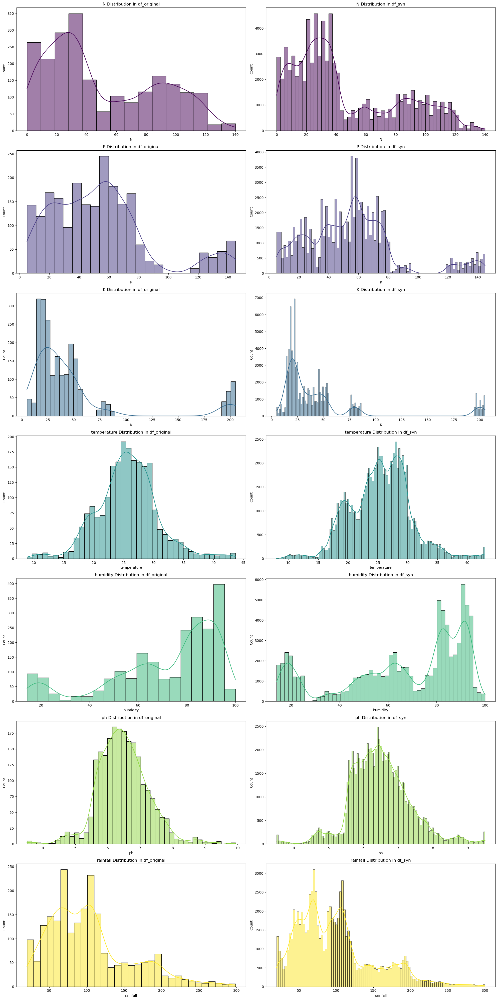

In [9]:
# List of columns you care about
columns = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']

# Plot side by side for comparison
fig, axs = plt.subplots(len(columns), 2, figsize=(20, 40))

colors = plt.cm.viridis(np.linspace(0, 1, len(columns)))

for i, (column, color) in enumerate(zip(columns, colors)):
    # Left side - Original
    sns.histplot(data=df_original, x=column, kde=True, color=color, ax=axs[i, 0]) 
    axs[i, 0].set_title(f'{column} Distribution in df_original')
    axs[i, 0].set_xlabel(column)
    axs[i, 0].set_ylabel('Count')

    # Right side - Syn
    sns.histplot(data=df_syn, x=column, kde=True, color=color, ax=axs[i, 1]) 
    axs[i, 1].set_title(f'{column} Distribution in df_syn')
    axs[i, 1].set_xlabel(column)
    axs[i, 1].set_ylabel('Count')

plt.tight_layout()
plt.show()

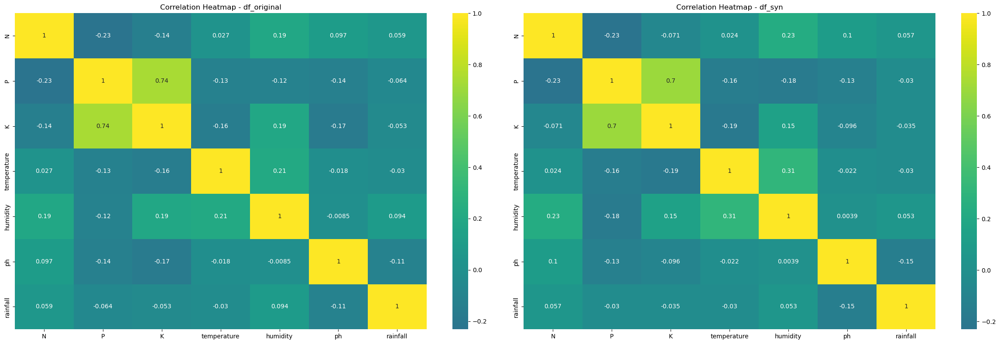

In [10]:
# Plot side by side correlation heatmaps for both datasets
fig, axs = plt.subplots(1, 2, figsize=(24, 8))

# Heatmap for df_original
correlation_matrix_original = df_original.select_dtypes(['number']).corr()
sns.heatmap(correlation_matrix_original, annot=True, cmap='viridis', center=0, ax=axs[0])
axs[0].set_title('Correlation Heatmap - df_original')

# Heatmap for df_syn
correlation_matrix_syn = df_syn.select_dtypes(['number']).corr()
sns.heatmap(correlation_matrix_syn, annot=True, cmap='viridis', center=0, ax=axs[1]) 
axs[1].set_title('Correlation Heatmap - df_syn')

plt.tight_layout()
plt.show()

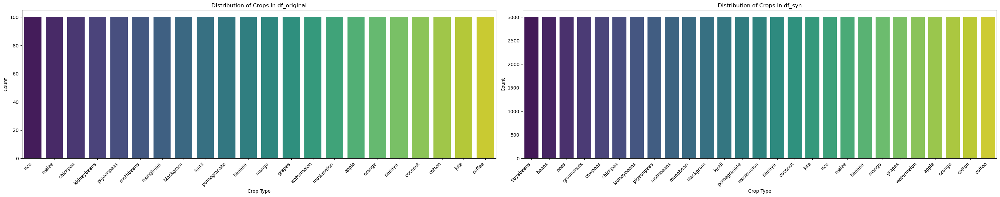

In [11]:
# Plot side by side countplots for both datasets
fig, axs = plt.subplots(1, 2, figsize=(30, 6))

# Countplot for df_original
sns.countplot(data=df_original, x='label', palette='viridis', ax=axs[0])
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45, ha='right')
axs[0].set_title('Distribution of Crops in df_original')
axs[0].set_xlabel('Crop Type')
axs[0].set_ylabel('Count')

# Countplot for df_syn
sns.countplot(data=df_syn, x='label', palette='viridis', ax=axs[1]) 
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45, ha='right')
axs[1].set_title('Distribution of Crops in df_syn')
axs[1].set_xlabel('Crop Type')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

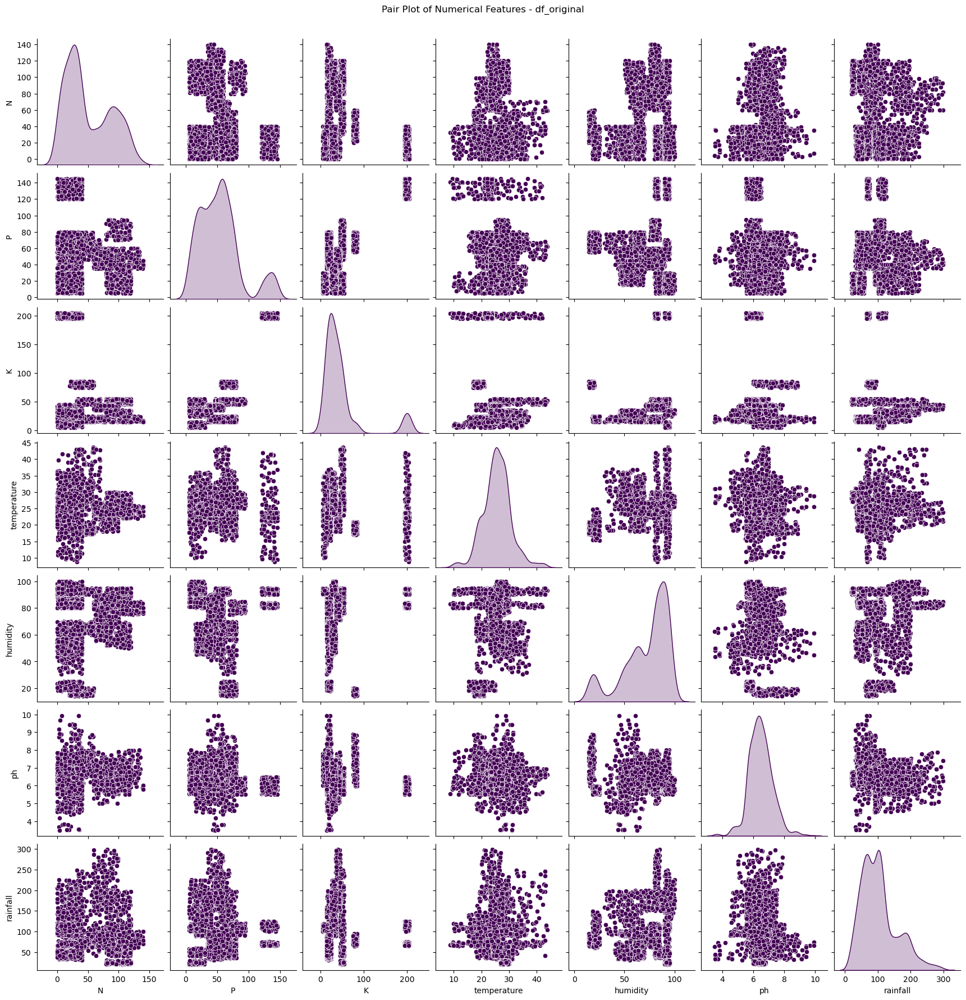

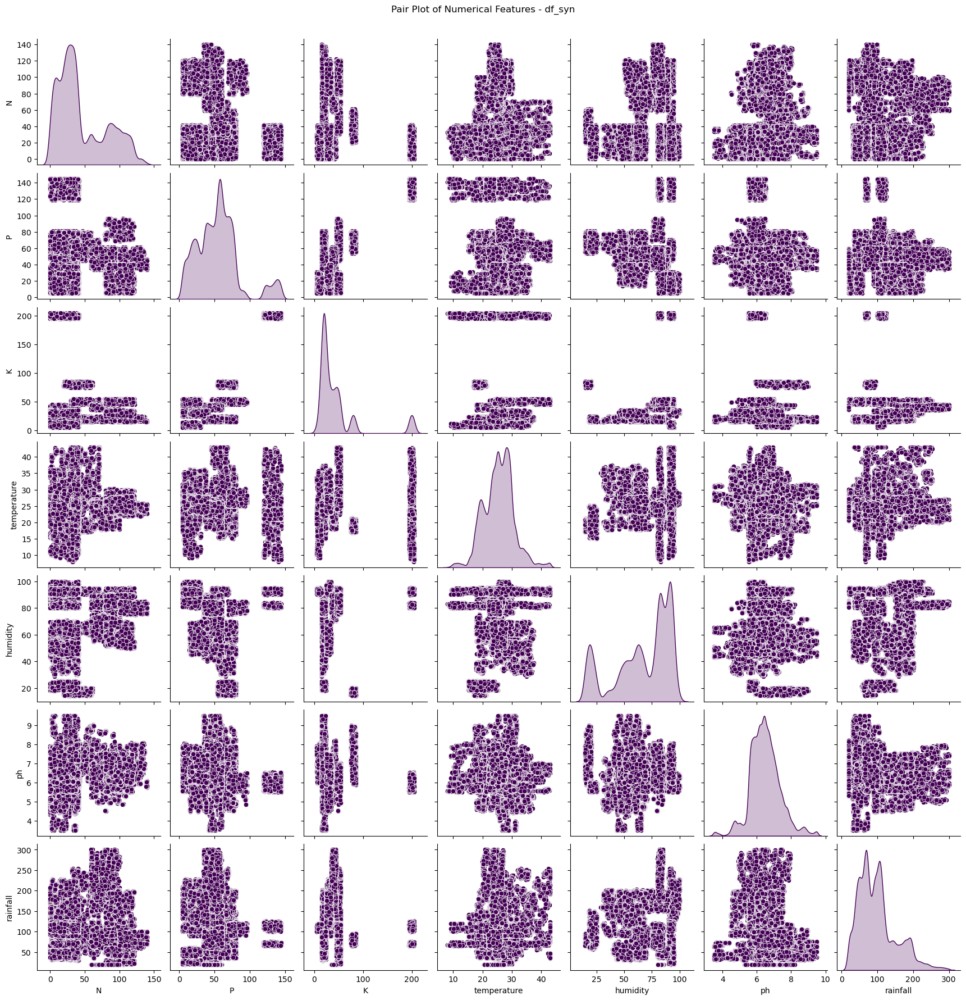

In [12]:
# Pairplot for df_original
sns.pairplot(df_original.drop('label', axis=1), diag_kind='kde', palette='viridis')
plt.suptitle('Pair Plot of Numerical Features - df_original', y=1.02)
plt.show()

# Pairplot for df_syn
sns.pairplot(df_syn.drop('label', axis=1), diag_kind='kde', palette='viridis')
plt.suptitle('Pair Plot of Numerical Features - df_syn', y=1.02)
plt.show()

In [13]:
print("Skewness Analysis:")
print("="*80)
numerical_features = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']

print(f'{"Feature":<15} | {"df_original":>15} | {"df_syn":>15}')
print("-"*80)

for feature in numerical_features:
    skew_df = df_original[feature].skew()
    skew_syn = df_syn[feature].skew()
    print(f'{feature:<15} | {skew_df:>15.3f} | {skew_syn:>15.3f}')

print("="*80)

Skewness Analysis:
Feature         |     df_original |          df_syn
--------------------------------------------------------------------------------
N               |           0.510 |           0.753
P               |           1.011 |           0.959
K               |           2.375 |           2.541
temperature     |           0.185 |           0.137
humidity        |          -1.092 |          -0.764
ph              |           0.284 |           0.292
rainfall        |           0.966 |           0.988


# **Model Training and Validation** 

In [15]:
def train_models(df, label='label', drop='rainfall'):
    """Train multiple models on the given dataset."""
    df = df.copy()

    # Separate label first
    y = df[label]
    class_names = np.unique(y)

    # Now drop label and drop column
    df = df.drop([label, drop], axis=1)

    # Select only numerical columns for training
    X = df.select_dtypes(include='number').copy()

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                        test_size=0.2, 
                                                        random_state=42)
    print(f"X_train shape: {X_train.shape}")
    print(f"X_test shape: {X_test.shape}\n")

    # Initialize classifiers
    decision_tree = DecisionTreeClassifier(random_state=42)
    logistic_regression = LogisticRegression(random_state=42, max_iter=1000)
    random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
    light_gbm = LGBMClassifier(random_state=42, verbose=-1)
    svc = SVC(random_state=42, probability=True)
    naive_bayes = GaussianNB()
    knn = KNeighborsClassifier(n_neighbors=5)

    # Train models
    decision_tree.fit(X_train, y_train)
    logistic_regression.fit(X_train, y_train)
    random_forest.fit(X_train, y_train)
    light_gbm.fit(X_train, y_train)
    svc.fit(X_train, y_train)
    naive_bayes.fit(X_train, y_train)
    knn.fit(X_train, y_train)

    print("Training completed.\n")

    return {
        "decision_tree": decision_tree,
        "logistic_regression": logistic_regression,
        "random_forest": random_forest,
        "light_gbm": light_gbm,
        "svc": svc,
        "naive_bayes": naive_bayes,
        "knn": knn,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "class_names": class_names
    }

print("Training models for df_original:")
models_df_original = train_models(df_original)

print("Training models for df_syn:")
models_df_syn = train_models(df_syn)



Training models for df_original:
X_train shape: (1760, 6)
X_test shape: (440, 6)

Training completed.

Training models for df_syn:
X_train shape: (64800, 6)
X_test shape: (16200, 6)

Training completed.



In [16]:
def compare_models(
    model1, X_test1, y_test1, class_names1,
    model2, X_test2, y_test2, class_names2,
    title1='Model 1',
    title2='Model 2',
    normalize=False
):
    """
    Compare two models side by side with confusion matrices and evaluation metrics.

    Parameters:
    - model1, model2: Trained classifier objects with .predict() method
    - X_test1, X_test2: Test feature sets
    - y_test1, y_test2: True labels for test sets
    - class_names1, class_names2: Corresponding class labels for confusion matrix ticks
    - title1, title2: Custom titles for the models in the plots
    - normalize: If True, displays normalized confusion matrix
    """

    # Predictions and metrics for model 1
    y_pred1 = model1.predict(X_test1)
    cm1 = confusion_matrix(y_test1, y_pred1, normalize='true' if normalize else None)
    accuracy1 = accuracy_score(y_test1, y_pred1)
    precision1 = precision_score(y_test1, y_pred1, average='weighted', zero_division=0)
    recall1 = recall_score(y_test1, y_pred1, average='weighted', zero_division=0)
    f1_1 = f1_score(y_test1, y_pred1, average='weighted', zero_division=0)

    # Predictions and metrics for model 2
    y_pred2 = model2.predict(X_test2)
    cm2 = confusion_matrix(y_test2, y_pred2, normalize='true' if normalize else None)
    accuracy2 = accuracy_score(y_test2, y_pred2)
    precision2 = precision_score(y_test2, y_pred2, average='weighted', zero_division=0)
    recall2 = recall_score(y_test2, y_pred2, average='weighted', zero_division=0)
    f1_2 = f1_score(y_test2, y_pred2, average='weighted', zero_division=0)

    # Plotting
    fig, axs = plt.subplots(1, 2, figsize=(16, 7))

    axs[0].set_title(
        f'{title1}\nAcc: {accuracy1:.4f} | Prec: {precision1:.4f} | Rec: {recall1:.4f} | F1: {f1_1:.4f}'
    )
    sns.heatmap(cm1, annot=True, fmt='.2f' if normalize else 'd',
                cmap='Blues', cbar=False,
                xticklabels=class_names1, yticklabels=class_names1, ax=axs[0])
    axs[0].set_xlabel("Predicted")
    axs[0].set_ylabel("Actual")

    axs[1].set_title(
        f'{title2}\nAcc: {accuracy2:.4f} | Prec: {precision2:.4f} | Rec: {recall2:.4f} | F1: {f1_2:.4f}'
    )
    sns.heatmap(cm2, annot=True, fmt='.2f' if normalize else 'd',
                cmap='Blues', cbar=False,
                xticklabels=class_names2, yticklabels=class_names2, ax=axs[1])
    axs[1].set_xlabel("Predicted")
    axs[1].set_ylabel("Actual")

    plt.tight_layout()
    plt.show()


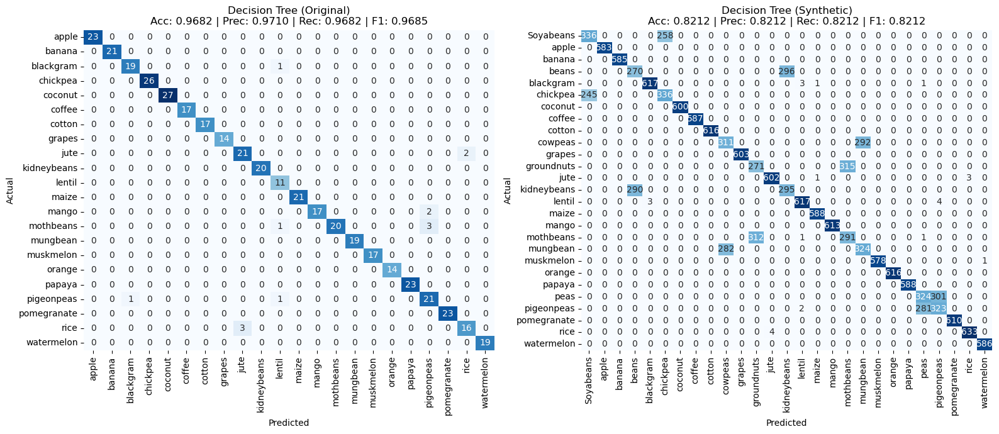

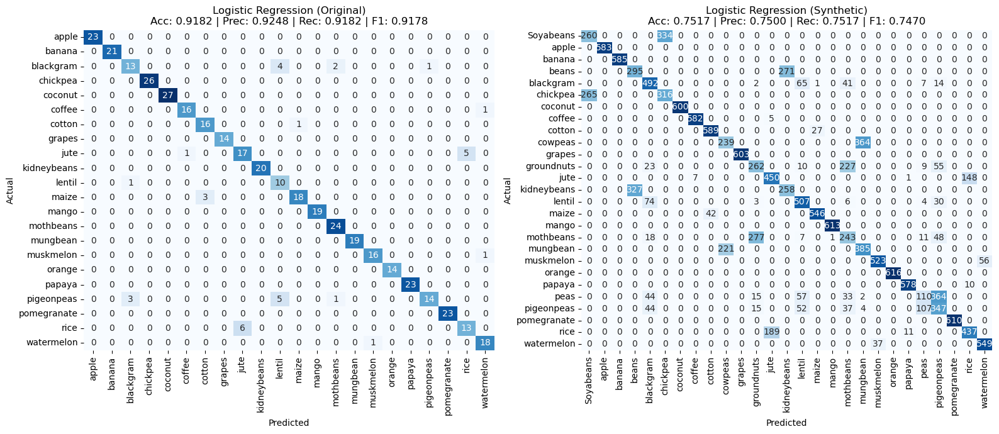

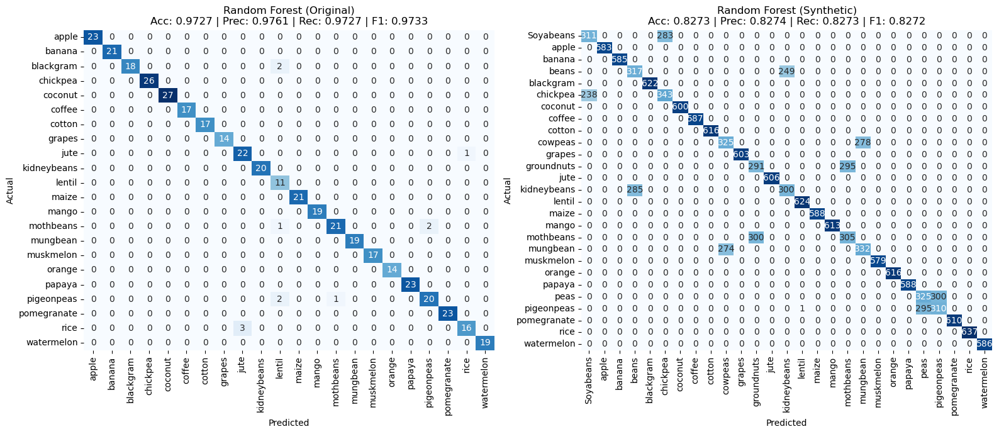

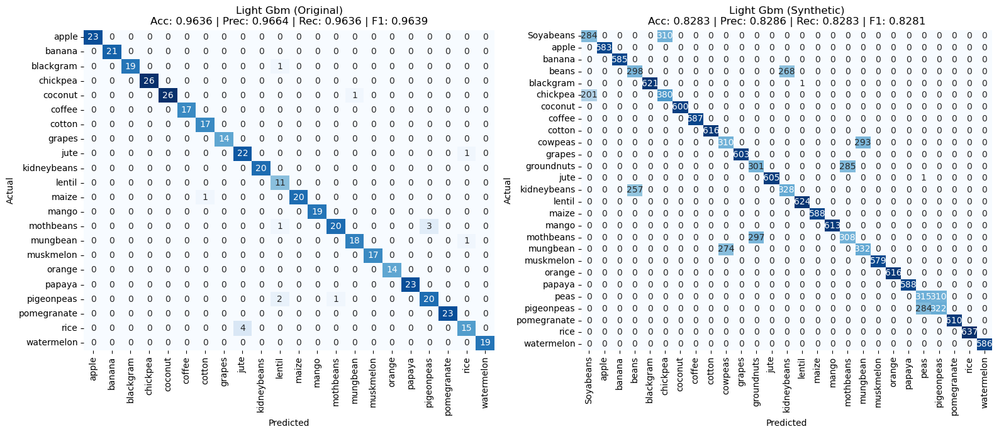

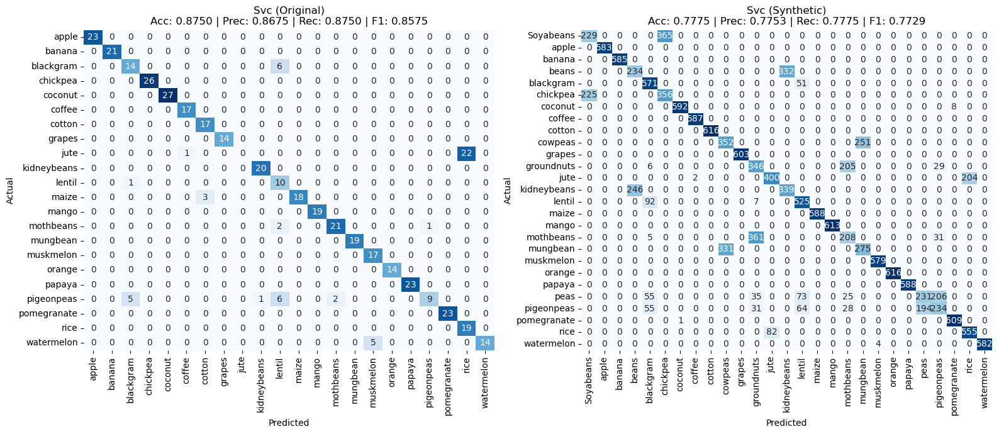

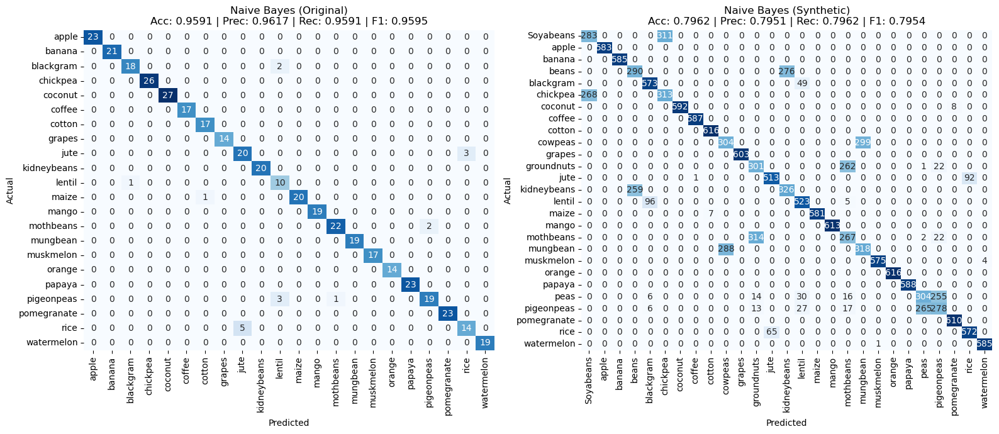

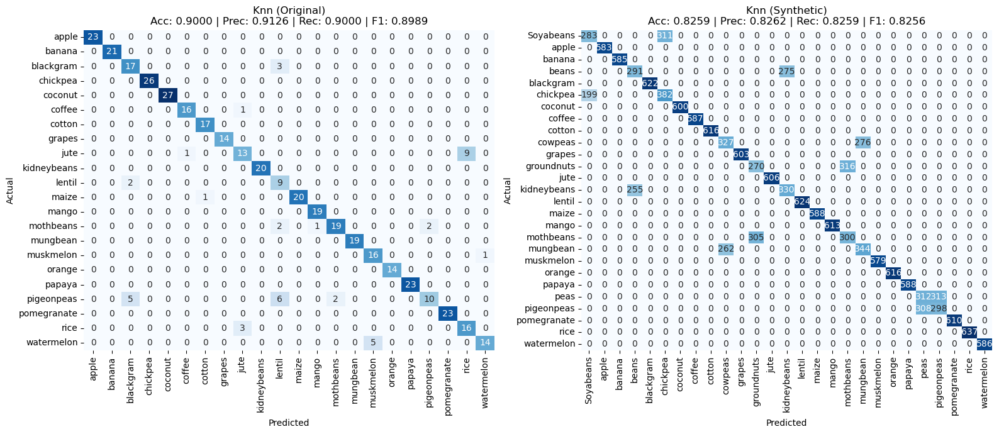

In [17]:
model_names = [
    'decision_tree', 
    'logistic_regression', 
    'random_forest', 
    'light_gbm', 
    'svc', 
    'naive_bayes', 
    'knn'
]

for model_name in model_names:
    compare_models(
        models_df_original[model_name], 
        models_df_original['X_test'], 
        models_df_original['y_test'], 
        models_df_original['class_names'], 
        models_df_syn[model_name], 
        models_df_syn['X_test'], 
        models_df_syn['y_test'], 
        models_df_syn['class_names'], 
        title1=f'{model_name.replace("_", " ").title()} (Original)', 
        title2=f'{model_name.replace("_", " ").title()} (Synthetic)'
    )

In [18]:
pip install memory-profiler

Note: you may need to restart the kernel to use updated packages.


In [19]:
import psutil
import time
import pandas as pd
from memory_profiler import memory_usage
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate(model, X_test, y_test, class_names=None, return_=False, conf_matrix=False):
    """Evaluate a trained classifier with metrics, execution time, CPU and memory utilization."""

    process = psutil.Process()

    def run_prediction():
        nonlocal y_pred, accuracy, precision, recall, f1
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

    # Measure memory and time
    y_pred = []
    accuracy = precision = recall = f1 = 0.0

    start = time.time()
    mem_usage = memory_usage((run_prediction,), interval=0.1, max_usage=True)
    time_taken = time.time() - start
    cpu_usage = psutil.cpu_percent(interval=1)

    model_name = str(type(model).__name__)
    metrics_dict = {
        "Model": model_name,
        "accuracy": round(accuracy, 4),
        "precision": round(precision, 4),
        "recall": round(recall, 4),
        "f1": round(f1, 4),
        "time(s)": round(time_taken, 4),
        "cpu_usage(%)": round(cpu_usage, 2),
        "memory_usage(MB)": round(mem_usage, 2)  # this is peak memory during the function
    }

    if return_:
        return metrics_dict

# --- Model Names ---
model_names = [
    'logistic_regression', 'decision_tree', 'random_forest', 
    'light_gbm', 'svc', 'naive_bayes', 'knn'
]

# --- Results Containers ---
results_original = []
results_synthetic = []

# --- Evaluate on Original Dataset ---
for name in model_names:
    classifier = models_df_original[name]
    metrics = evaluate(
        classifier,
        X_test=models_df_original['X_test'], 
        y_test=models_df_original['y_test'], 
        class_names=models_df_original['class_names'], 
        return_=True
    )
    metrics['Model'] = name
    results_original.append(metrics)

# --- Evaluate on Synthetic Dataset ---
for name in model_names:
    classifier = models_df_syn[name]
    metrics = evaluate(
        classifier,
        X_test=models_df_syn['X_test'], 
        y_test=models_df_syn['y_test'], 
        class_names=models_df_syn['class_names'], 
        return_=True
    )
    metrics['Model'] = name
    results_synthetic.append(metrics)

# --- Convert to DataFrames ---
results_df_original = pd.DataFrame(results_original).set_index("Model").round(4)
results_df_synthetic = pd.DataFrame(results_synthetic).set_index("Model").round(4)

# --- Output ---
print("Original Dataset")
print(results_df_original)

print("\nEnhanced/Synthetic Dataset")
print(results_df_synthetic)

Original Dataset
                     accuracy  precision  recall      f1  time(s)  \
Model                                                               
logistic_regression    0.9182     0.9248  0.9182  0.9178   4.1758   
decision_tree          0.9682     0.9710  0.9682  0.9685   4.4988   
random_forest          0.9727     0.9761  0.9727  0.9733   3.6625   
light_gbm              0.9636     0.9664  0.9636  0.9639   2.7997   
svc                    0.8750     0.8675  0.8750  0.8575   1.9577   
naive_bayes            0.9591     0.9617  0.9591  0.9595   3.6041   
knn                    0.9000     0.9126  0.9000  0.8989   3.6916   

                     cpu_usage(%)  memory_usage(MB)  
Model                                                
logistic_regression          46.2            731.02  
decision_tree                26.9            731.06  
random_forest                13.9            731.06  
light_gbm                    22.8            731.06  
svc                          22.9    

#Lower usage on synthetic data (3%–12%) may be due to more efficient, vectorized memory accesses or passive background tasks during execution.

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Updated list of metrics to visualize
metrics_to_plot = [
    "accuracy",
    "f1",
    "precision",
    "recall",
    "time(s)", 
    "cpu_usage(%)",
    "memory_usage(MB)"
]

def plot_metrics(results_df, title=None):
    """
    Plot bar charts for selected metrics with model comparison and annotations.
    """
    # Ensure numeric types
    for col in metrics_to_plot:
        results_df[col] = pd.to_numeric(results_df[col], errors='coerce').fillna(0.0)

    num_metrics = len(metrics_to_plot)
    rows = (num_metrics + 1) // 2

    plt.figure(figsize=(16, 6 * rows))  # Dynamic based on metric count

    for i, metric in enumerate(metrics_to_plot, 1):
        # Sort values for better visual comparison
        sorted_df = results_df.sort_values(by=metric, ascending=False)

        plt.subplot(rows, 2, i)
        ax = sns.barplot(x=sorted_df.index, y=metric, data=sorted_df, palette='coolwarm')

        # Annotate each bar
        for p, row in zip(ax.patches, sorted_df.itertuples(index=True)):
            value = getattr(row, metric)
            if metric not in ["time(s)", "cpu_usage(%)", "memory_usage(MB)"]:
                annotation = (
                    f'{value:.4f}\n'
                    f'Time: {getattr(row, "time(s)"):.2f}s\n'
                    f'CPU: {getattr(row, "cpu_usage(%)"):.1f}%\n'
                    f'RAM: {getattr(row, "memory_usage(MB)"):.1f}MB'
                )
            else:
                annotation = f'{value:.2f}'
            ax.annotate(annotation,
                        (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center',
                        va='bottom',
                        xytext=(0, 5),
                        textcoords='offset points',
                        fontsize=10)

        plt.title(metric.replace("_", " ").capitalize())
        plt.xlabel("Model")
        plt.ylabel(metric.replace("_", " ").capitalize())
        plt.xticks(rotation=45)

    if title:
        plt.suptitle(title, fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [22]:
import plotly.express as px
import pandas as pd

# Combine original and synthetic results
df_orig = results_df_original.copy()
df_orig['Dataset'] = 'Original'

df_syn = results_df_synthetic.copy()
df_syn['Dataset'] = 'Synthetic'

combined_df = pd.concat([df_orig, df_syn]).reset_index()  # 'Model' becomes a column

# Ensure numeric precision is clean
combined_df = combined_df.round(4)

# Define metrics to visualize
metrics_to_plot = ['accuracy', 'f1', 'precision', 'recall']

# Loop through and plot each metric comparison
for metric in metrics_to_plot:
    fig = px.bar(
        combined_df,
        x='Model',
        y=metric,
        color='Dataset',
        barmode='group',
        hover_data={
            'Model': False,
            'Dataset': True,
            'cpu_usage(%)': True,
            'memory_usage(MB)': True,  # ✅ Added this line
            'time(s)': True
        },
        title=f'{metric.capitalize()} Comparison: Original vs Synthetic',
        height=500
    )

    fig.update_layout(
        xaxis_title='Model',
        yaxis_title=metric.capitalize(),
        legend_title='Dataset',
        xaxis_tickangle=-45,
        bargap=0.3
    )

    fig.show()

# **TESTING**

In [24]:
# Plotting function for predicted probabilties by models
def plot_predicted_probabilities(features, class_names, models, title='Predicted Probabilities'):
    """
    Plot predicted probabilties for each class by model.
    """
    # Perform predictions and collect
    probs = []
    for model_name, model in models.items():
        pred = model.predict_proba([features])[0]
        probs.append(pred)
        # Update class_names if it's different
        if class_names is None or len(class_names) == 0:
            class_names = model.classes_

        elif not np.array_equal(class_names, model.classes_):
            print(f"Warning: Model {model_name} classes do not match provided class_names.")
            class_names = model.classes_

    # Create a DataFrame to store the probabilties
    probs_df = pd.DataFrame(probs, index=models.keys(), columns=class_names).reset_index()
    probs_df = probs_df.melt(id_vars='index', var_name='Class', value_name='Probability')
    probs_df = probs_df.rename(columns={'index': 'Model'})

    # Plotting
    plt.figure(figsize=(10, 6))
    barplot = sns.barplot(x='Class', y='Probability', hue='Model', data=probs_df, palette='viridis')
    barplot.set_title(title, fontsize=16)
    barplot.set_xlabel('Class', fontsize=14)
    barplot.set_ylabel('Probability', fontsize=14)
    barplot.tick_params(axis='x', rotation=65)
    barplot.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Display recommended class (with highest probability by Random Forest)
    rf_probs = models['Random Forest'].predict_proba([features])[0]
    predicted = class_names[np.argmax(rf_probs)]
    print(f"Recommended crop by Random Forest: {predicted}")

    return probs_df

In [25]:
# testing on forst rows of each dataset
def test_datasets(models_df_original, models_df_syn):
    """
    Test both datasets with their respective first-row inputs.
    """
    # Retrieve trained models and data from the dictionaries
    models_original = {
        "Logistic Regression": models_df_original['logistic_regression'], 
        "Decision Tree": models_df_original['decision_tree'], 
        "Random Forest": models_df_original['random_forest'], 
        "LightGBM": models_df_original['light_gbm'], 
        "SVC": models_df_original['svc'],
        "Naive Bayes": models_df_original['naive_bayes'],
        "KNN": models_df_original['knn']
    }
    models_synthetic = {
        "Logistic Regression": models_df_syn['logistic_regression'], 
        "Decision Tree": models_df_syn['decision_tree'], 
        "Random Forest": models_df_syn['random_forest'], 
        "LightGBM": models_df_syn['light_gbm'], 
        "SVC": models_df_syn['svc'],
        "Naive Bayes": models_df_syn['naive_bayes'],
        "KNN": models_df_syn['knn']
    }

    class_names = models_df_original['class_names']

    # First row of each dataset
    features_original = models_df_original['X_test'].iloc[0].tolist()
    features_synthetic = models_df_syn['X_test'].iloc[0].tolist()

    print("Predicted Probabilities for Original Dataset")
    plot_predicted_probabilities(features_original, class_names, models_original, title='Predicted Probabilities (Original)')
    print("\nPredicted Probabilities for Enhanced/Synthetic Dataset")
    plot_predicted_probabilities(features_synthetic, class_names, models_synthetic, title='Predicted Probabilities (Enhanced/Synthetic)')

In [26]:
def test_same_input(models_df_original, models_df_syn):
    """
    Test both datasets with the SAME input from the original dataset.
    """
    # Define model keys and labels
    model_labels = {
        "Logistic Regression": 'logistic_regression', 
        "Decision Tree": 'decision_tree', 
        "Random Forest": 'random_forest', 
        "LightGBM": 'light_gbm', 
        "SVC": 'svc',
        "Naive Bayes": 'naive_bayes',
        "KNN": 'knn'
    }

    # Retrieve trained models
    models_original = {label: models_df_original[key] for label, key in model_labels.items()}
    models_synthetic = {label: models_df_syn[key] for label, key in model_labels.items()}

    # Retrieve class names
    class_names = models_df_original['class_names']

    # Use first input row from original dataset for both comparisons
    input_features = models_df_original['X_test'].iloc[0].tolist()

    print("\n📊 Predicted Probabilities for Original Dataset with SAME Input")
    plot_predicted_probabilities(input_features, class_names, models_original, title='Original Dataset (Same Input)')

    print("\n📊 Predicted Probabilities for Enhanced/Synthetic Dataset with SAME Input")
    plot_predicted_probabilities(input_features, class_names, models_synthetic, title='Synthetic Dataset (Same Input)')

=== Testing with different inputs ===
Predicted Probabilities for Original Dataset


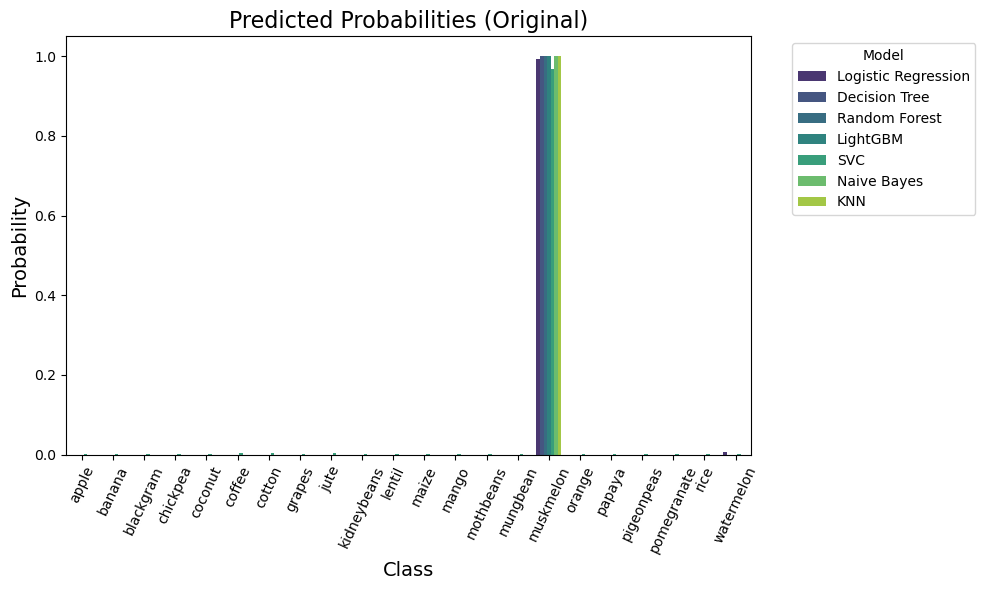

Recommended crop by Random Forest: muskmelon

Predicted Probabilities for Enhanced/Synthetic Dataset


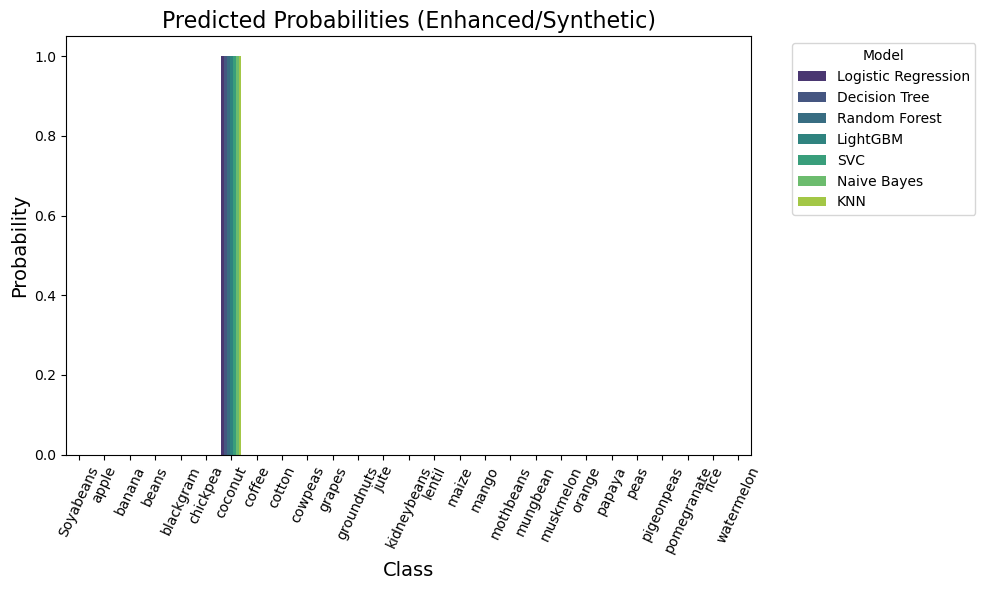

Recommended crop by Random Forest: coconut


In [27]:
# First, test with different inputs
print("=== Testing with different inputs ===")
test_datasets(models_df_original, models_df_syn)


=== Testing with the SAME input ===

📊 Predicted Probabilities for Original Dataset with SAME Input


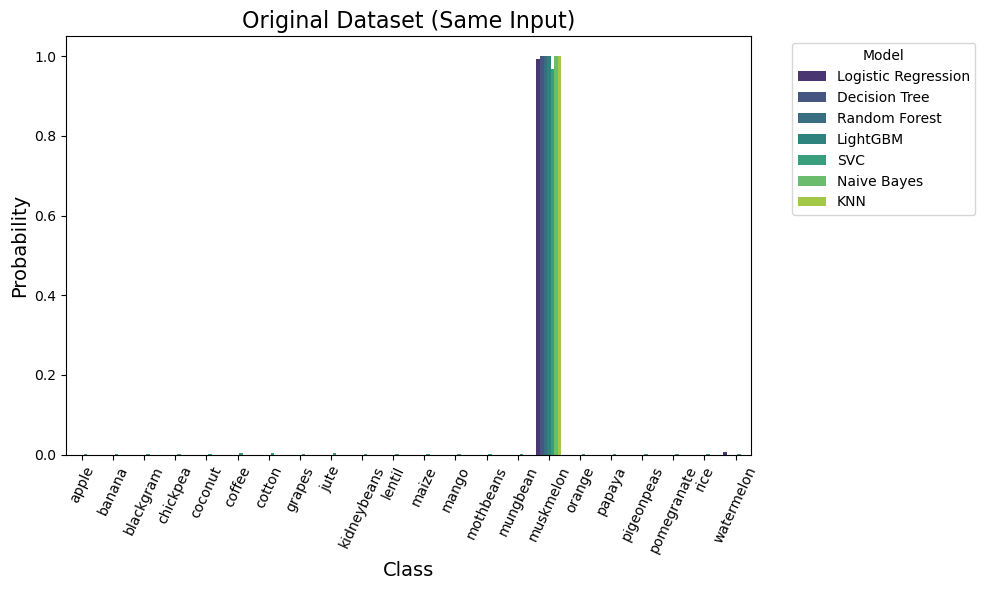

Recommended crop by Random Forest: muskmelon

📊 Predicted Probabilities for Enhanced/Synthetic Dataset with SAME Input


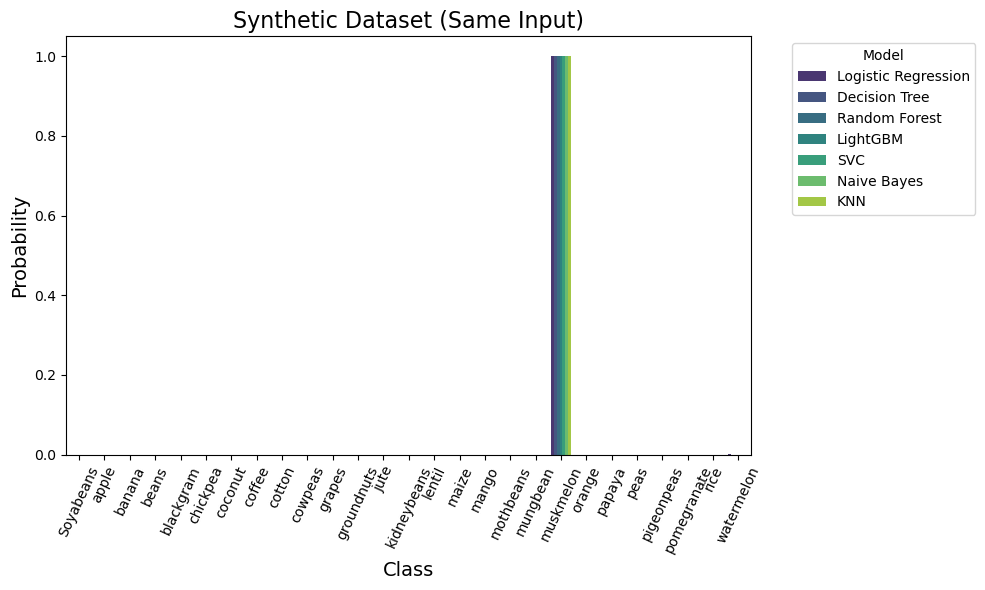

Recommended crop by Random Forest: muskmelon


In [28]:
# Then, test with the SAME input
print("\n=== Testing with the SAME input ===")
test_same_input(models_df_original, models_df_syn)

###  Task 2: Hyperparameters Used & Their Stages

| Model                 | Hyperparameter(s)                                 | Stage      | Notes                                                        |
|----------------------|---------------------------------------------------|------------|--------------------------------------------------------------|
| **Logistic Regression** | `random_state=42`, `max_iter=1000`                | Training   | `max_iter` ensures convergence                               |
| **Decision Tree**       | `random_state=42`                                 | Training   | For reproducibility                                          |
| **Random Forest**       | `n_estimators=100`, `random_state=42`             | Training   | Default depth and features used                              |
| **LightGBM**            | `random_state=42`, `verbose=-1`                   | Training   | `verbose=-1` silences training logs                          |
| **SVC**                 | `random_state=42`, `probability=True`             | Training   | `probability=True` enables `predict_proba()`                |
| **Naive Bayes**         | _(None explicitly set)_                           | Training   | Uses all default settings                                    |
| **K-Nearest Neighbors** | `n_neighbors=5`                                   | Inference  | Defines number of neighbors used during prediction           |


### Task 3: Automating Hyperparameter Tuning

focus on the top-performing models: 
Random Forest, LightGBM, Decision Tree, and K-Nearest Neighbors

We apply `GridSearchCV` for models with smaller hyperparameter spaces and `RandomizedSearchCV` for those with larger spaces to efficiently explore combinations.

| Model               | Hyperparameters Tuned                                 | Tuning Method         |
|---------------------|--------------------------------------------------------|------------------------|
| Random Forest       | `n_estimators`, `max_depth`, `min_samples_split`       | RandomizedSearchCV     |
| LightGBM            | `n_estimators`, `learning_rate`, `max_depth`           | RandomizedSearchCV     |
| Decision Tree       | `max_depth`, `min_samples_split`, `criterion`          | GridSearchCV           |
| K-Nearest Neighbors | `n_neighbors`, `weights`, `p`                          | GridSearchCV           |
| Naive Bayes         | *(Not tunable - basic model)*                          | None                   |


In [31]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import make_scorer, accuracy_score
from scipy.stats import randint, uniform
import warnings
warnings.filterwarnings("ignore")

def tune_models(X_train, y_train):
    tuned_models = {}

    # ------------------ Random Forest ------------------
    print("Tuning Random Forest...")
    rf = RandomForestClassifier(random_state=42)
    rf_param_dist = {
        'n_estimators': randint(50, 200),
        'max_depth': randint(3, 20),
        'min_samples_split': randint(2, 10)
    }
    rf_search = RandomizedSearchCV(
        rf, rf_param_dist, n_iter=20, cv=3,
        scoring=make_scorer(accuracy_score), n_jobs=-1, random_state=42
    )
    rf_search.fit(X_train, y_train)
    tuned_models['random_forest'] = rf_search.best_estimator_

    # ------------------ LightGBM ------------------
    print("Tuning LightGBM...")
    lgbm = LGBMClassifier(random_state=42, verbose=-1)
    lgbm_param_dist = {
        'n_estimators': randint(50, 300),
        'learning_rate': uniform(0.01, 0.3),
        'max_depth': randint(3, 20)
    }
    lgbm_search = RandomizedSearchCV(
        lgbm, lgbm_param_dist, n_iter=20, cv=3,
        scoring=make_scorer(accuracy_score), n_jobs=-1, random_state=42
    )
    lgbm_search.fit(X_train, y_train)
    tuned_models['light_gbm'] = lgbm_search.best_estimator_

    # ------------------ Decision Tree ------------------
    print("Tuning Decision Tree...")
    dt = DecisionTreeClassifier(random_state=42)
    dt_param_grid = {
        'max_depth': [None, 5, 10, 15],
        'min_samples_split': [2, 4, 6],
        'criterion': ['gini', 'entropy']
    }
    dt_search = GridSearchCV(
        dt, dt_param_grid, cv=3,
        scoring=make_scorer(accuracy_score), n_jobs=-1
    )
    dt_search.fit(X_train, y_train)
    tuned_models['decision_tree'] = dt_search.best_estimator_

    # ------------------ K-Nearest Neighbors ------------------
    print("Tuning K-Nearest Neighbors...")
    knn = KNeighborsClassifier()
    knn_param_grid = {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]  # 1: Manhattan, 2: Euclidean
    }
    knn_search = GridSearchCV(
        knn, knn_param_grid, cv=3,
        scoring=make_scorer(accuracy_score), n_jobs=-1
    )
    knn_search.fit(X_train, y_train)
    tuned_models['knn'] = knn_search.best_estimator_

    print("\n Hyperparameter tuning complete.\n")
    print("Best Parameters:")
    for name, model in tuned_models.items():
        print(f"\n🔹 {name.capitalize()}:")
        if hasattr(model, "get_params"):
            for param, val in model.get_params().items():
                if param in ['n_estimators', 'max_depth', 'min_samples_split', 'learning_rate', 'criterion', 'n_neighbors', 'weights', 'p']:
                    print(f"   {param}: {val}")
        else:
            print("No tunable parameters.")
    
    return tuned_models


In [32]:
# For original dataset
tuned_models_original = tune_models(models_df_original['X_train'], models_df_original['y_train'])

Tuning Random Forest...
Tuning LightGBM...
Tuning Decision Tree...
Tuning K-Nearest Neighbors...

 Hyperparameter tuning complete.

Best Parameters:

🔹 Random_forest:
   criterion: gini
   max_depth: 9
   min_samples_split: 3
   n_estimators: 124

🔹 Light_gbm:
   learning_rate: 0.03718193035984624
   max_depth: 14
   n_estimators: 104

🔹 Decision_tree:
   criterion: gini
   max_depth: 15
   min_samples_split: 6

🔹 Knn:
   n_neighbors: 9
   p: 1
   weights: distance


In [33]:
# For synthetic dataset
tuned_models_synthetic = tune_models(models_df_syn['X_train'], models_df_syn['y_train'])

Tuning Random Forest...
Tuning LightGBM...
Tuning Decision Tree...
Tuning K-Nearest Neighbors...

 Hyperparameter tuning complete.

Best Parameters:

🔹 Random_forest:
   criterion: gini
   max_depth: 17
   min_samples_split: 4
   n_estimators: 121

🔹 Light_gbm:
   learning_rate: 0.07238249886045664
   max_depth: 6
   n_estimators: 103

🔹 Decision_tree:
   criterion: entropy
   max_depth: 15
   min_samples_split: 6

🔹 Knn:
   n_neighbors: 9
   p: 1
   weights: distance


In [34]:
def train_top_models_original(df, label='label', drop='rainfall'):
    """Train top 4 models (RF, LGBM, DT, KNN) with tuned hyperparameters on original dataset."""
    df = df.copy()

    # Separate label
    y = df[label]
    class_names = np.unique(y)

    # Drop label and unused column
    df = df.drop([label, drop], axis=1)
    X = df.select_dtypes(include='number').copy()

    # Split
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.2,
                                                        random_state=42)
    print(f"X_train shape: {X_train.shape}")
    print(f"X_test shape: {X_test.shape}\n")

    # Instantiate tuned models
    random_forest = RandomForestClassifier(
        n_estimators=124,
        max_depth=9,
        min_samples_split=3,
        criterion='gini',
        random_state=42
    )

    light_gbm = LGBMClassifier(
        n_estimators=104,
        learning_rate=0.03718193035984624,
        max_depth=14,
        random_state=42,
        verbose=-1
    )

    decision_tree = DecisionTreeClassifier(
        max_depth=15,
        min_samples_split=6,
        criterion='gini',
        random_state=42
    )

    knn = KNeighborsClassifier(
        n_neighbors=9,
        p=1,
        weights='distance'
    )

    # Train
    random_forest.fit(X_train, y_train)
    light_gbm.fit(X_train, y_train)
    decision_tree.fit(X_train, y_train)
    knn.fit(X_train, y_train)

    print("Tuned top 4 model training completed.\n")

    return {
        "random_forest": random_forest,
        "light_gbm": light_gbm,
        "decision_tree": decision_tree,
        "knn": knn,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "class_names": class_names
    }

# Use it like this
print(" Training top-tuned models for df_original:")
tuned_models_df_original = train_top_models_original(df_original)


🔧 Training top-tuned models for df_original:
X_train shape: (1760, 6)
X_test shape: (440, 6)

Tuned top 4 model training completed.



In [66]:
df_syn = pd.read_csv(r"D:\Nokia\synthetic_crop_data_tvae.csv")
def train_top_models_synthetic(df, label='label', drop='rainfall'):
    """Train top 4 models (RF, LGBM, DT, KNN) with tuned hyperparameters on synthetic dataset."""
    df = df.copy()

    # Separate label
    y = df[label]
    class_names = np.unique(y)

    # Drop label and unused column
    df = df.drop([label, drop], axis=1)
    X = df.select_dtypes(include='number').copy()

    # Split
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.2,
                                                        random_state=42)
    print(f"X_train shape: {X_train.shape}")
    print(f"X_test shape: {X_test.shape}\n")

    # Instantiate tuned models
    random_forest = RandomForestClassifier(
        n_estimators=121,
        max_depth=17,
        min_samples_split=4,
        criterion='gini',
        random_state=42
    )

    light_gbm = LGBMClassifier(
        n_estimators=103,
        learning_rate=0.07238249886045664,
        max_depth=6,
        random_state=42,
        verbose=-1
    )

    decision_tree = DecisionTreeClassifier(
        max_depth=15,
        min_samples_split=6,
        criterion='entropy',
        random_state=42
    )

    knn = KNeighborsClassifier(
        n_neighbors=9,
        p=1,
        weights='distance'
    )

    # Train
    random_forest.fit(X_train, y_train)
    light_gbm.fit(X_train, y_train)
    decision_tree.fit(X_train, y_train)
    knn.fit(X_train, y_train)

    print("Tuned top 4 model training completed on synthetic dataset.\n")

    return {
        "random_forest": random_forest,
        "light_gbm": light_gbm,
        "decision_tree": decision_tree,
        "knn": knn,
        "X_train": X_train,
        "X_test": X_test,
        "y_train": y_train,
        "y_test": y_test,
        "class_names": class_names
    }

# Use it like this
print("Training top-tuned models for df_synthetic:")
tuned_models_df_synthetic = train_top_models_synthetic(df_syn)

Training top-tuned models for df_synthetic:
X_train shape: (64800, 6)
X_test shape: (16200, 6)

Tuned top 4 model training completed on synthetic dataset.



In [74]:
# List of tuned model names
tuned_model_names = ["random_forest", "light_gbm", "decision_tree", "knn"]

# Initialize results list
tuned_results_synthetic = []

# Evaluate tuned models on synthetic test data
for name in tuned_model_names:
    classifier = tuned_models_df_synthetic[name]
    metrics = evaluate(
        classifier,
        X_test=tuned_models_df_synthetic['X_test'],
        y_test=tuned_models_df_synthetic['y_test'],
        class_names=tuned_models_df_synthetic['class_names'],
        return_=True
    )
    metrics["Model"] = name
    tuned_results_synthetic.append(metrics)

# Convert to DataFrame
tuned_results_df_synthetic = pd.DataFrame(tuned_results_synthetic).set_index("Model").round(4)

# Display
print("📊 Tuned Model Results on Synthetic Dataset:")
print(tuned_results_df_synthetic)


📊 Tuned Model Results on Synthetic Dataset:
               accuracy  precision  recall      f1  time(s)  cpu_usage(%)  \
Model                                                                       
random_forest    0.8288     0.8291  0.8288  0.8283   1.5241          17.8   
light_gbm        0.8263     0.8266  0.8263  0.8257   1.9380          17.9   
decision_tree    0.8210     0.8228  0.8210  0.8187   1.1911           8.2   
knn              0.8250     0.8252  0.8250  0.8247   1.2951          11.2   

               memory_usage(MB)  
Model                            
random_forest            213.80  
light_gbm                224.68  
decision_tree            222.21  
knn                      226.89  
